In [110]:
%matplotlib inline
import seaborn
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display
plt.rcParams['figure.figsize'] = (30, 5)

In [111]:
x, sr = librosa.load('Quadratic Formula Fugue.wav', sr=None)

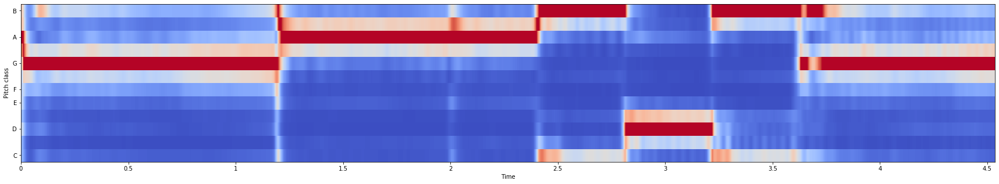

In [248]:
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=50)
librosa.display.specshow(chromagram[:, :2000], x_axis='time', y_axis='chroma', hop_length=50, cmap='coolwarm')

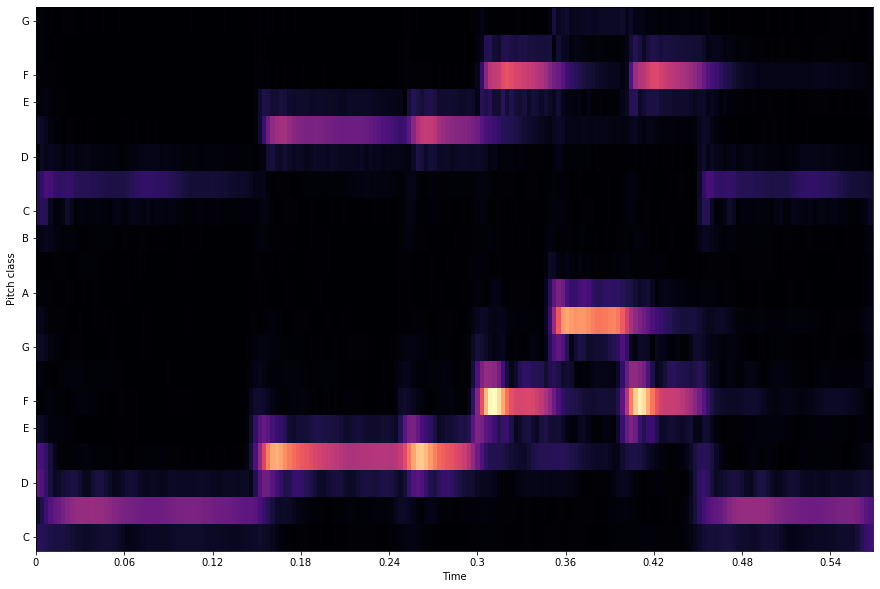

In [192]:
chromagram = librosa.core.cqt(x[:100000], sr=sr, fmin=librosa.note_to_hz('C1'), filter_scale=1.5)
plt.figure(figsize=(15, 10))
librosa.display.specshow(chromagram[30:50, :], x_axis='time', y_axis='chroma', hop_length=64)

**Summary of work so far:**

You can adjust the trade-off between time and pitch fidelity using the filter_scale argument.

Librosa's built-in energy and onset detection functions are kind of trash. We might just want to stick with what was already built for this.

Also, CQT basically doesn't allow zooming in on a particular range of frequencies, and is very inflexible to that kind of stuff. We should also check alignment issues, because the labels in the visual don't appear to be accurate.

Using a chromagram as one of the channels might improve performance, because its job is to detect which notes (rather than frequencies) are present. On the other hand, it's quite possible that it doesn't offer any additional knowledge other than what the CQT provides.


## Experimentation with manual filters

Demonstration of a simple filter:

In [194]:
from scipy import signal
import numpy as np

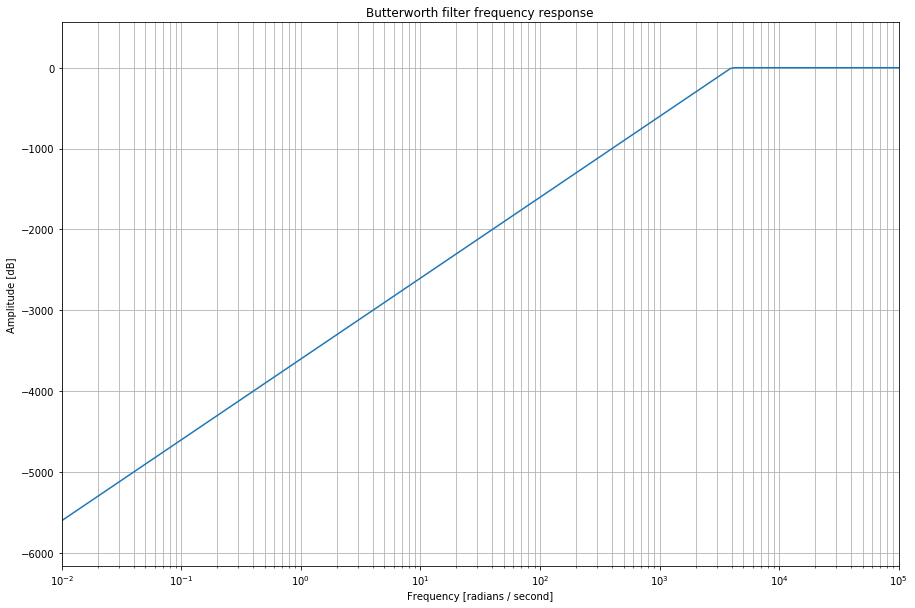

In [208]:
b, a = signal.butter(50, 4000, 'highpass', analog=True)
w, h = signal.freqs(b, a)
plt.figure(figsize=(15, 10))
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.show()

Original audio:

In [226]:
ipd.Audio(x, rate=sr)

Filtered audio:

In [227]:
high = signal.butter(50, 2000, 'hp', fs=sr, output='sos')
low = signal.butter(50, 16000, 'lp', fs=sr, output='sos')
filtered = signal.sosfilt(low, signal.sosfilt(high, x))
ipd.Audio(filtered, rate=sr)

Original audio with filtered emphasized:

In [228]:
ipd.Audio(15*filtered+x, rate=sr)

Visualization of filtered audio. Observe that the predominant notes are different than the original!

Filtered:


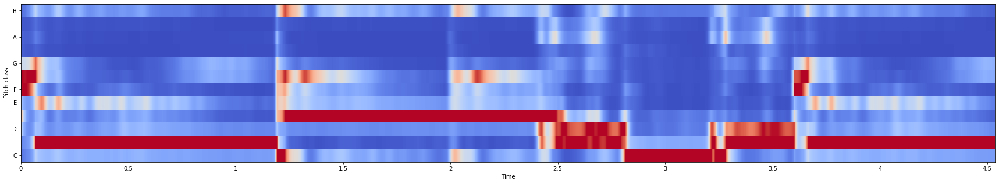

In [249]:
chromagram_filtered = librosa.feature.chroma_stft(filtered, sr=sr, hop_length=50)
print("Filtered:")
librosa.display.specshow(chromagram_filtered[:, :2000], x_axis='time', y_axis='chroma', hop_length=50, cmap='coolwarm')

Non-filtered:


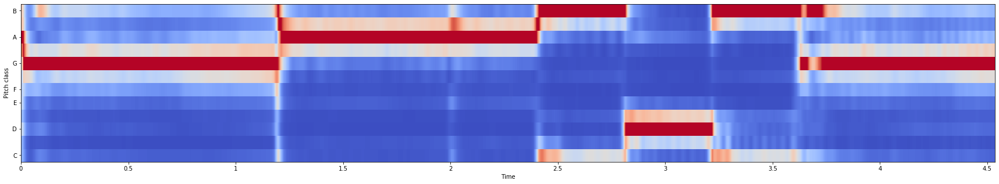

In [250]:
print("Non-filtered:")
librosa.display.specshow(chromagram[:, :2000], x_axis='time', y_axis='chroma', hop_length=50, cmap='coolwarm')

Another experiment to try just for fun: attenuate the specific frequencies given by the chromagram from the original audio:

In [410]:
def attenuate(note_list, data):
    for note in note_list:
        fs = sr  # Sample frequency (Hz)
        f0 = librosa.note_to_hz(note)  # Frequency to be removed from signal (Hz)
        Q = 30.0  # Quality factor
        w0 = f0 / (fs / 2 )  # Normalized Frequency
        b, a = signal.iirnotch( w0, Q )
        low = signal.butter(50, 16000, 'lp', fs=sr, output='sos')
        data = scipy.signal.filtfilt(b, a, data)
    return data

In [411]:
def attenuate_whole_signal(signal, chrom, hop_length):
    import copy
    original_signal = copy.copy(signal)

    notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
    def note_index_to_notes(index):
        return [notes[index] + str(n) for n in range(2, 8)]

    chromagram_notes = np.argmax(chrom, axis=0)
    notes_to_attenuate = np.array([note_index_to_notes(note_index) for note_index in chromagram_notes])

    change_indices = []
    prev_note = chromagram_notes[0]
    for i, note in enumerate(list(chromagram_notes)):
        if note != prev_note:
            change_indices.append(i)
            prev_note = note
    change_indices.append(chromagram_notes.shape[0])

    prev_index = 0
    cur_notes_to_attenuate = notes_to_attenuate[0, :]
    new_signal = np.array([])
    for i in change_indices:
        # Attenuate!
        x_slice = attenuate(list(cur_notes_to_attenuate), original_signal[prev_index*hop_length:i*hop_length])
        new_signal = np.concatenate([new_signal, x_slice])
        if i < notes_to_attenuate.shape[0]:
            cur_notes_to_attenuate = notes_to_attenuate[i, :]
            prev_index = i
            
    return new_signal

In [412]:
new_signal = attenuate_whole_signal(x, chromagram[:, :10000], hop_length=50)

In [413]:
ipd.Audio(new_signal, rate=sr)

This demo doesn't quite work, because with only one note being attenuated, there's nothing left to hear, so ipd.Audio normalizes it back to virtually its original volume. Then, the algorithm (in its current state) stops working because we're using a hard argmax.